# Thermal Preference Elicitation Framework

Currently, this framework has been validated for only 1D (operating temp) feature.

In this example notebook, we consider an example case in which we assume that the utility of occupant is defined as below <img src="img.png">

# Step 1

Load required modules

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline
import sys
sys.path.append('../')
from GPElicit import elicit
from Misc import visualize

/Users/nimishawalgaonkar/anaconda2/lib/python2.7/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


# Step 2

1. Occupant walks inside the room and is exposed to state r.
2. Randomly change the state of the room to new state s.
3. Ask the occupant which state they prefer. 
4. If they say state current state s, then record y as 1. If they say previous state r, then record y as 0.
This first duel is our initial duel.
5. Put the duel value and response in the '../data/duels/duels.csv' file



In [2]:
# Load the duels file
data_file = '../data/duels/duels1.csv'

In [3]:
data = pd.read_csv(data_file)
data # check if the duels data is as you want it to be

,Unnamed: 0,Tprev,Tcurrent,y,MEUI
0,0,15,20,1,NaN


In [4]:
iter_num = data.shape[0]

In [5]:
Tprev = np.array(data.Tprev) # previous state (operating temp.)
Tcurrent = np.array(data.Tcurrent) # current state <---- elicitation framework will give you this values
X = np.vstack([[Tprev, Tcurrent]]).T
X = X.astype(float) # features need to be float
Y = np.array(data.y)[:,None] # response of the occupant <---- you need to ask occupant about this

# Step 3

Now, we want to find the next elicited state. So, we need to use **elicit** module.

In [6]:
config_file = '../config_files/thermal_config.json' # configuration for grid (how fine you want to be)
trial_num = 2 # this is just to save all the plots in '../data/results/T1' if trial_num = 1 ; T2 if trial_num = 2

burn-in sampling started
Iteration:  100 	 Acc Rate:  98.0 %
Iteration:  200 	 Acc Rate:  100.0 %
Iteration:  300 	 Acc Rate:  100.0 %
Iteration:  400 	 Acc Rate:  100.0 %
Iteration:  500 	 Acc Rate:  100.0 %
burn-in sampling ended
Iteration:  100 	 Acc Rate:  98.0 %
Iteration:  200 	 Acc Rate:  99.0 %
Iteration:  300 	 Acc Rate:  100.0 %
Iteration:  400 	 Acc Rate:  100.0 %
Iteration:  500 	 Acc Rate:  100.0 %
Iteration:  600 	 Acc Rate:  100.0 %
Iteration:  700 	 Acc Rate:  100.0 %
Iteration:  800 	 Acc Rate:  100.0 %
Iteration:  900 	 Acc Rate:  100.0 %
Iteration:  1000 	 Acc Rate:  100.0 %
Iteration:  1100 	 Acc Rate:  100.0 %
Iteration:  1200 	 Acc Rate:  100.0 %
Iteration:  1300 	 Acc Rate:  100.0 %
Iteration:  1400 	 Acc Rate:  100.0 %
Iteration:  1500 	 Acc Rate:  100.0 %
Iteration:  1600 	 Acc Rate:  100.0 %
Iteration:  1700 	 Acc Rate:  100.0 %
Iteration:  1800 	 Acc Rate:  100.0 %
Iteration:  1900 	 Acc Rate:  100.0 %
Iteration:  2000 	 Acc Rate:  100.0 %
burn-in sampling st

/Users/nimishawalgaonkar/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


burn-in sampling started
Iteration:  100 	 Acc Rate:  97.0 %
Iteration:  200 	 Acc Rate:  99.0 %
Iteration:  300 	 Acc Rate:  100.0 %
Iteration:  400 	 Acc Rate:  100.0 %
Iteration:  500 	 Acc Rate:  100.0 %
burn-in sampling ended
Iteration:  100 	 Acc Rate:  98.0 %
Iteration:  200 	 Acc Rate:  100.0 %
Iteration:  300 	 Acc Rate:  100.0 %
Iteration:  400 	 Acc Rate:  100.0 %
Iteration:  500 	 Acc Rate:  100.0 %
Iteration:  600 	 Acc Rate:  99.0 %
Iteration:  700 	 Acc Rate:  99.0 %
Iteration:  800 	 Acc Rate:  100.0 %
Iteration:  900 	 Acc Rate:  100.0 %
Iteration:  1000 	 Acc Rate:  99.0 %
Iteration:  1100 	 Acc Rate:  100.0 %
Iteration:  1200 	 Acc Rate:  100.0 %
Iteration:  1300 	 Acc Rate:  100.0 %
Iteration:  1400 	 Acc Rate:  99.0 %
Iteration:  1500 	 Acc Rate:  99.0 %
Iteration:  1600 	 Acc Rate:  100.0 %
Iteration:  1700 	 Acc Rate:  100.0 %
Iteration:  1800 	 Acc Rate:  100.0 %
Iteration:  1900 	 Acc Rate:  99.0 %
Iteration:  2000 	 Acc Rate:  99.0 %
burn-in sampling started
I

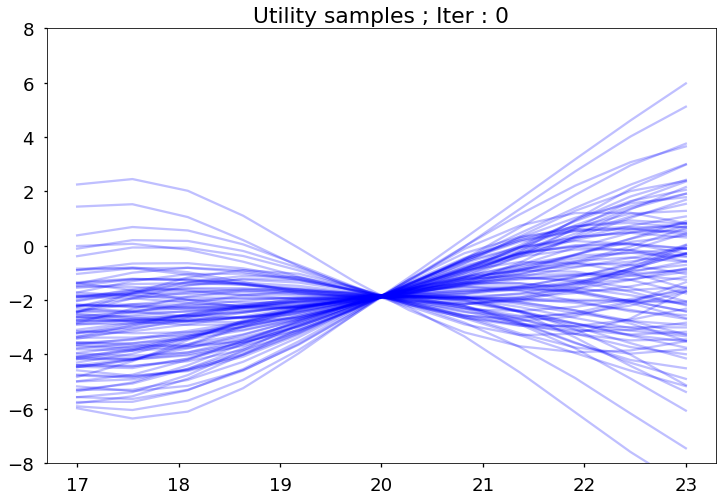

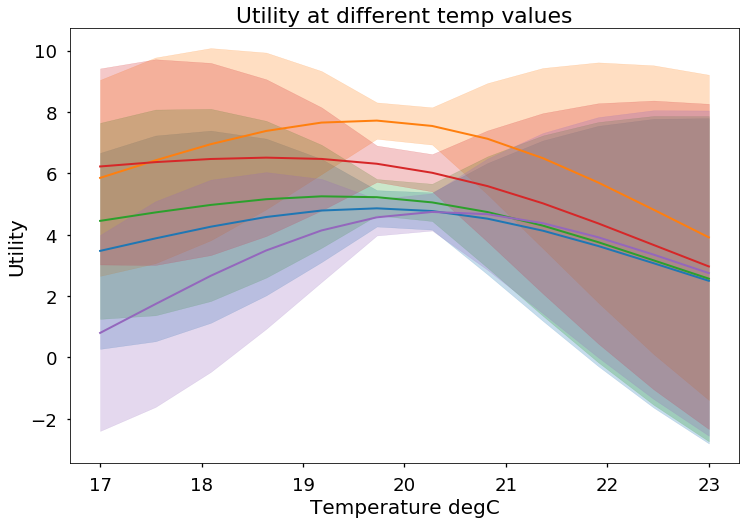

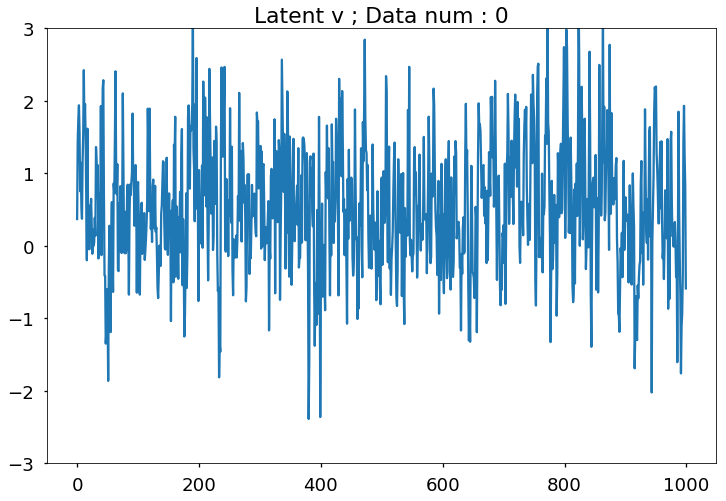

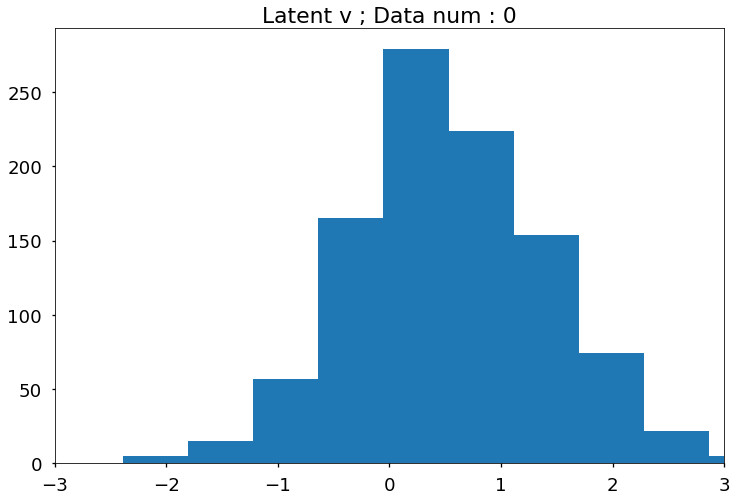

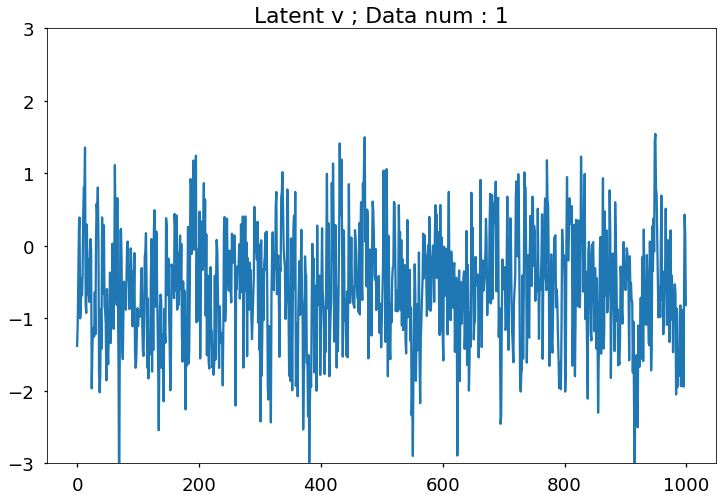

...

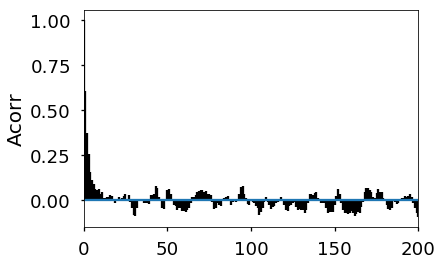

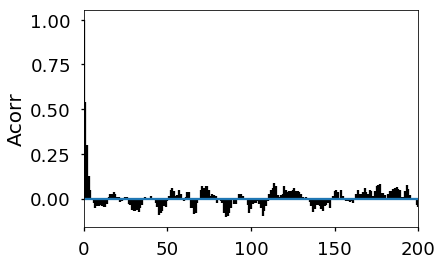

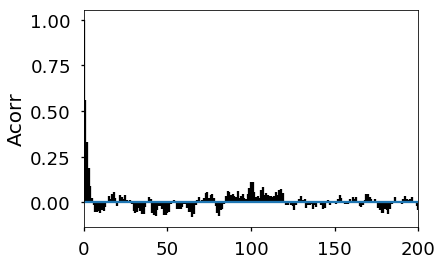

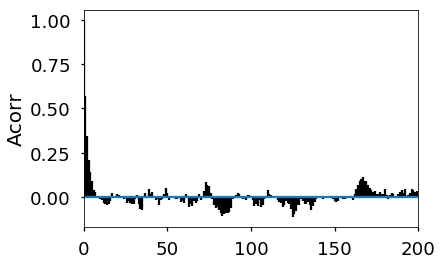

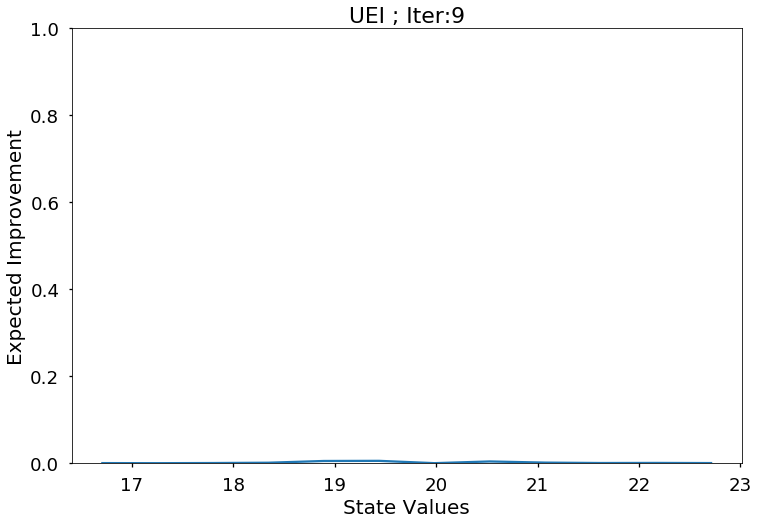

In [7]:
r = elicit.seq_learning(X, Y, 10, config_file, trial_num, True)

In [9]:
r[2]

array([[15.        , 20.        ],
       [20.        , 23.        ],
       [23.        , 26.        ],
       [26.        , 27.        ],
       [27.        , 24.27272727],
       [24.27272727, 21.27272727],
       [21.27272727, 18.27272727],
       [18.27272727, 19.09090909],
       [19.09090909, 17.18181818],
       [17.18181818, 19.7107438 ],
       [19.7107438 , 19.43801653]])